In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sb

plt.rcParams['figure.figsize'] = (12, 8)
plt.style.use('seaborn-whitegrid')

# ETL

In [3]:
df=pd.read_csv('/Users/ruhidmirzayev/Jupyther Notebooks/Palette/Data/TurkeyEarthquake/earthquake.csv')

In [5]:
# MD: Duration 
# ML: Local
# Mw: Moment
# Ms: Surface wave
# Mb: Body-wave
# xm: higher magnitude
df

,id,date,time,lat,long,country,city,area,direction,dist,depth,xm,md,richter,mw,ms,mb
0,2.000000e+13,2003.05.20,12:17:44 AM,39.04,40.38,turkey,bingol,baliklicay,west,0.1,10.0,4.1,4.1,0.0,NaN,0.0,0.0
1,2.010000e+13,2007.08.01,12:03:08 AM,40.79,30.09,turkey,kocaeli,bayraktar_izmit,west,0.1,5.2,4.0,3.8,4.0,NaN,0.0,0.0
2,1.980000e+13,1978.05.07,12:41:37 AM,38.58,27.61,turkey,manisa,hamzabeyli,south_west,0.1,0.0,3.7,0.0,0.0,NaN,0.0,3.7
3,2.000000e+13,1997.03.22,12:31:45 AM,39.47,36.44,turkey,sivas,kahvepinar_sarkisla,south_west,0.1,10.0,3.5,3.5,0.0,NaN,0.0,0.0
4,2.000000e+13,2000.04.02,12:57:38 AM,40.80,30.24,turkey,sakarya,meseli_serdivan,south_west,0.1,7.0,4.3,4.3,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24002,2.020000e+13,2017.03.10,12:23:42 AM,37.50,38.48,turkey,adiyaman,kirmacik_samsat,NaN,NaN,13.0,4.2,0.0,4.2,4.0,0.0,0.0
24003,2.020000e+13,2017.03.10,12:42:44 AM,40.47,35.84,turkey,amasya,kizoglu,NaN,NaN,5.6,3.6,0.0,3.5,3.6,0.0,0.0
24004,2.020000e+13,2017.04.05,12:08:11 AM,38.63,27.57,turkey,manisa,cavusoglu,NaN,NaN,10.6,4.1,0.0,4.0,4.1,0.0,0.0
24005,2.020000e+13,2017.04.05,12:35:09 AM,38.65,27.55,turkey,manisa,cavusoglu,NaN,NaN,8.7,3.8,0.0,3.6,3.8,0.0,0.0


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24007 entries, 0 to 24006
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   id         24007 non-null  float64
 1   date       24007 non-null  object 
 2   time       24007 non-null  object 
 3   lat        24007 non-null  float64
 4   long       24007 non-null  float64
 5   country    24007 non-null  object 
 6   city       11754 non-null  object 
 7   area       12977 non-null  object 
 8   direction  10062 non-null  object 
 9   dist       10062 non-null  float64
 10  depth      24007 non-null  float64
 11  xm         24007 non-null  float64
 12  md         24007 non-null  float64
 13  richter    24007 non-null  float64
 14  mw         5003 non-null   float64
 15  ms         24007 non-null  float64
 16  mb         24007 non-null  float64
dtypes: float64(11), object(6)
memory usage: 3.1+ MB


In [7]:
df.isna().sum()

id               0
date             0
time             0
lat              0
long             0
country          0
city         12253
area         11030
direction    13945
dist         13945
depth            0
xm               0
md               0
richter          0
mw           19004
ms               0
mb               0
dtype: int64

<AxesSubplot:>

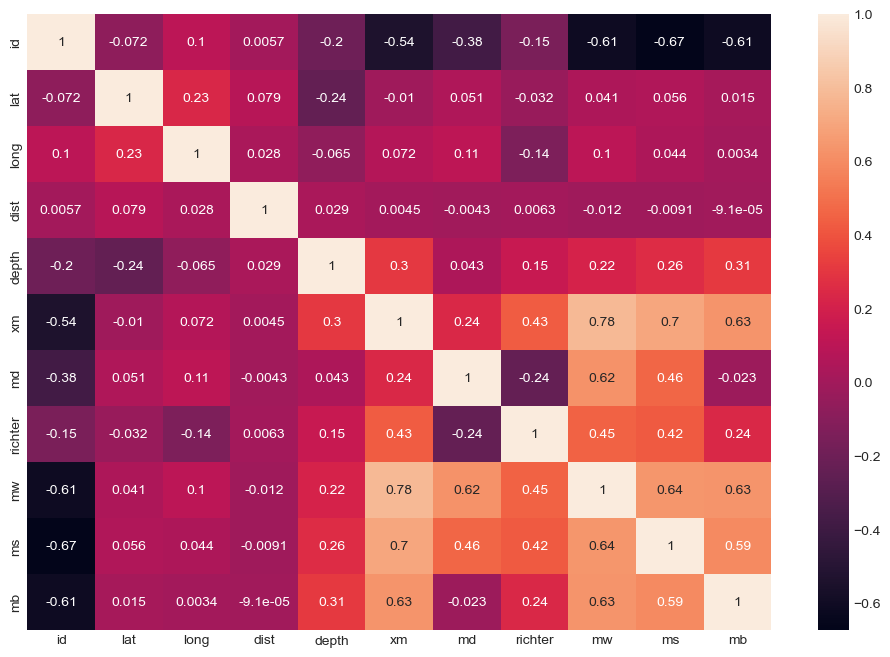

In [10]:
sb.heatmap(df.corr(), annot=True)

## Date Column

In [16]:
df['Date']=pd.to_datetime(df['date'] + ' ' + df['time'])

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24007 entries, 0 to 24006
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         24007 non-null  float64       
 1   date       24007 non-null  object        
 2   time       24007 non-null  object        
 3   lat        24007 non-null  float64       
 4   long       24007 non-null  float64       
 5   country    24007 non-null  object        
 6   city       11754 non-null  object        
 7   area       12977 non-null  object        
 8   direction  10062 non-null  object        
 9   dist       10062 non-null  float64       
 10  depth      24007 non-null  float64       
 11  xm         24007 non-null  float64       
 12  md         24007 non-null  float64       
 13  richter    24007 non-null  float64       
 14  mw         5003 non-null   float64       
 15  ms         24007 non-null  float64       
 16  mb         24007 non-null  float64      

## Country

In [30]:
df['country']=df['country'].str.capitalize()

In [32]:
df['country'].unique()

array(['Turkey', 'Azerbaijan', 'Bulgaria', 'Mediterranean', 'Greece',
       'Georgia ', 'Russia', 'Iran', 'Macedonia', 'Aegeansea', 'Syria',
       'Blacksea', 'Cyprus_greek', 'Cyprus_turkish', 'Iraq', 'Romania',
       'Turkiye_iran', 'Turkiye_armenia', 'Turkiye_syria', 'Turkiye_iraq',
       'Israel', '#name?', 'Albania', 'Ukrainia', 'Turkiye_georgia ',
       'Egypt'], dtype=object)

In [43]:
df['country'].replace(to_replace={
    'Aegeansea': 'Aegean Sea',
    'Blacksea': 'Black Sea',
    'Cyprus_greek': 'Cyprus',
    'Cyprus_turkish': 'Cyprus',
    'Turkiye_iran': 'Iran',
    'Turkiye_armenia': 'Armenia',
    'Turkiye_syria': 'Syria',
    'Turkiye_iraq':'Iraq',
    'Ukrainia': 'Ukraine',
    'Turkiye_georgia': 'Georgia',
    'Turkiye_georgia ': 'Georgia'

}, inplace=True)

/var/folders/gq/w27c8tf566sgn4w3l9xyrhdm0000gn/T/ipykernel_20632/2089512626.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['country'].replace(to_replace={


In [44]:
df= df.loc[df['country']!='#name?']

In [45]:
df['country'].unique()

array(['Turkey', 'Azerbaijan', 'Bulgaria', 'Mediterranean', 'Greece',
       'Georgia ', 'Russia', 'Iran', 'Macedonia', 'Aegean Sea', 'Syria',
       'Black Sea', 'Cyprus', 'Iraq', 'Romania', 'Armenia', 'Israel',
       'Albania', 'Ukraine', 'Georgia', 'Egypt'], dtype=object)

## Richter

In [48]:
df['richter']

0        0.0
1        4.0
2        0.0
3        0.0
4        0.0
        ... 
24002    4.2
24003    3.5
24004    4.0
24005    3.6
24006    3.4
Name: richter, Length: 23997, dtype: float64

In [51]:
df.describe()

,id,lat,long,dist,depth,xm,md,richter,mw,ms,mb
count,2.399700e+04,23997.000000,23997.000000,10062.000000,23997.000000,23997.000000,23997.000000,23997.000000,4998.000000,23997.00000,23997.000000
mean,1.991974e+13,37.930855,30.772730,3.175015,18.482960,4.056120,1.913143,2.196150,4.479412,0.67796,1.691266
std,2.060450e+11,2.204957,6.585571,4.715461,23.210221,0.574165,2.059839,2.081582,1.048501,1.67600,2.146278
min,1.910000e+13,29.740000,18.340000,0.100000,0.000000,3.500000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,1.980000e+13,36.190000,26.190000,1.400000,5.000000,3.600000,0.000000,0.000000,4.100000,0.00000,0.000000
50%,2.000000e+13,38.200000,28.340000,2.300000,10.000000,3.900000,0.000000,3.500000,4.700000,0.00000,0.000000
75%,2.010000e+13,39.360000,33.850000,3.600000,22.300000,4.400000,3.800000,4.000000,5.000000,0.00000,4.100000
max,2.020000e+13,46.350000,48.000000,95.400000,225.000000,7.900000,7.400000,7.200000,7.700000,7.90000,7.100000


In [52]:
df.columns

Index(['id', 'date', 'time', 'lat', 'long', 'country', 'city', 'area',
       'direction', 'dist', 'depth', 'xm', 'md', 'richter', 'mw', 'ms', 'mb',
       'Date'],
      dtype='object')

## City

In [61]:
df['city']=df['city'].str.capitalize()

In [56]:
cols_1=['Date', 'lat', 'long', 'country', 'city', 'dist', 'depth', 'xm', 'md', 'richter', 'mw', 'ms', 'mb']

In [62]:
df[cols_1]

,Date,lat,long,country,city,dist,depth,xm,md,richter,mw,ms,mb
0,2003-05-20 00:17:44,39.04,40.38,Turkey,Bingol,0.1,10.0,4.1,4.1,0.0,NaN,0.0,0.0
1,2007-08-01 00:03:08,40.79,30.09,Turkey,Kocaeli,0.1,5.2,4.0,3.8,4.0,NaN,0.0,0.0
2,1978-05-07 00:41:37,38.58,27.61,Turkey,Manisa,0.1,0.0,3.7,0.0,0.0,NaN,0.0,3.7
3,1997-03-22 00:31:45,39.47,36.44,Turkey,Sivas,0.1,10.0,3.5,3.5,0.0,NaN,0.0,0.0
4,2000-04-02 00:57:38,40.80,30.24,Turkey,Sakarya,0.1,7.0,4.3,4.3,0.0,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
24002,2017-03-10 00:23:42,37.50,38.48,Turkey,Adiyaman,NaN,13.0,4.2,0.0,4.2,4.0,0.0,0.0
24003,2017-03-10 00:42:44,40.47,35.84,Turkey,Amasya,NaN,5.6,3.6,0.0,3.5,3.6,0.0,0.0
24004,2017-04-05 00:08:11,38.63,27.57,Turkey,Manisa,NaN,10.6,4.1,0.0,4.0,4.1,0.0,0.0
24005,2017-04-05 00:35:09,38.65,27.55,Turkey,Manisa,NaN,8.7,3.8,0.0,3.6,3.8,0.0,0.0


In [73]:
gdf=gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat), crs=4326)

In [78]:
gdf = gdf.to_crs(4326)


In [74]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 23997 entries, 0 to 24006
Data columns (total 19 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   id         23997 non-null  float64       
 1   date       23997 non-null  object        
 2   time       23997 non-null  object        
 3   lat        23997 non-null  float64       
 4   long       23997 non-null  float64       
 5   country    23997 non-null  object        
 6   city       11754 non-null  object        
 7   area       12977 non-null  object        
 8   direction  10062 non-null  object        
 9   dist       10062 non-null  float64       
 10  depth      23997 non-null  float64       
 11  xm         23997 non-null  float64       
 12  md         23997 non-null  float64       
 13  richter    23997 non-null  float64       
 14  mw         4998 non-null   float64       
 15  ms         23997 non-null  float64       
 16  mb         23997 non-null  float

<AxesSubplot:>

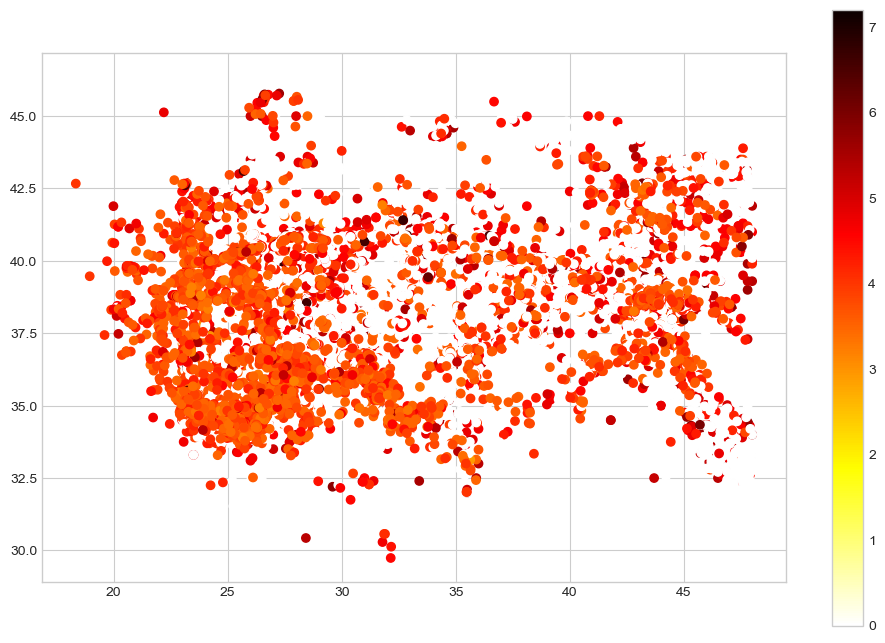

In [85]:
gdf.plot(column='richter', cmap='hot_r', legend=True)

In [93]:
gdf[['country', 'city', 'depth', 'dist', 'richter', 'geometry' ]]\
    .explore(
    column='richter',
    cmap='hot_r',
    tooltip=True
    )

In [100]:
df['Year']=df['Date'].dt.year

In [101]:
df['Month'] = df['Date'].dt.month

In [102]:
df['Day']=df['Date'].dt.day

In [103]:
df['Hour']=df['Date'].dt.hour

In [96]:
df

,id,date,time,lat,long,country,city,area,direction,dist,depth,xm,md,richter,mw,ms,mb,Date,geometry
0,2.000000e+13,2003.05.20,12:17:44 AM,39.04,40.38,Turkey,Bingol,baliklicay,west,0.1,10.0,4.1,4.1,0.0,NaN,0.0,0.0,2003-05-20 00:17:44,POINT (40.38000 39.04000)
1,2.010000e+13,2007.08.01,12:03:08 AM,40.79,30.09,Turkey,Kocaeli,bayraktar_izmit,west,0.1,5.2,4.0,3.8,4.0,NaN,0.0,0.0,2007-08-01 00:03:08,POINT (30.09000 40.79000)
2,1.980000e+13,1978.05.07,12:41:37 AM,38.58,27.61,Turkey,Manisa,hamzabeyli,south_west,0.1,0.0,3.7,0.0,0.0,NaN,0.0,3.7,1978-05-07 00:41:37,POINT (27.61000 38.58000)
3,2.000000e+13,1997.03.22,12:31:45 AM,39.47,36.44,Turkey,Sivas,kahvepinar_sarkisla,south_west,0.1,10.0,3.5,3.5,0.0,NaN,0.0,0.0,1997-03-22 00:31:45,POINT (36.44000 39.47000)
4,2.000000e+13,2000.04.02,12:57:38 AM,40.80,30.24,Turkey,Sakarya,meseli_serdivan,south_west,0.1,7.0,4.3,4.3,0.0,NaN,0.0,0.0,2000-04-02 00:57:38,POINT (30.24000 40.80000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24002,2.020000e+13,2017.03.10,12:23:42 AM,37.50,38.48,Turkey,Adiyaman,kirmacik_samsat,NaN,NaN,13.0,4.2,0.0,4.2,4.0,0.0,0.0,2017-03-10 00:23:42,POINT (38.48000 37.50000)
24003,2.020000e+13,2017.03.10,12:42:44 AM,40.47,35.84,Turkey,Amasya,kizoglu,NaN,NaN,5.6,3.6,0.0,3.5,3.6,0.0,0.0,2017-03-10 00:42:44,POINT (35.84000 40.47000)
24004,2.020000e+13,2017.04.05,12:08:11 AM,38.63,27.57,Turkey,Manisa,cavusoglu,NaN,NaN,10.6,4.1,0.0,4.0,4.1,0.0,0.0,2017-04-05 00:08:11,POINT (27.57000 38.63000)
24005,2.020000e+13,2017.04.05,12:35:09 AM,38.65,27.55,Turkey,Manisa,cavusoglu,NaN,NaN,8.7,3.8,0.0,3.6,3.8,0.0,0.0,2017-04-05 00:35:09,POINT (27.55000 38.65000)


In [104]:
df

,id,date,time,lat,long,country,city,area,direction,dist,...,richter,mw,ms,mb,Date,geometry,Year,Month,Day,Hour
0,2.000000e+13,2003.05.20,12:17:44 AM,39.04,40.38,Turkey,Bingol,baliklicay,west,0.1,...,0.0,NaN,0.0,0.0,2003-05-20 00:17:44,POINT (40.38000 39.04000),2003,5,20,0
1,2.010000e+13,2007.08.01,12:03:08 AM,40.79,30.09,Turkey,Kocaeli,bayraktar_izmit,west,0.1,...,4.0,NaN,0.0,0.0,2007-08-01 00:03:08,POINT (30.09000 40.79000),2007,8,1,0
2,1.980000e+13,1978.05.07,12:41:37 AM,38.58,27.61,Turkey,Manisa,hamzabeyli,south_west,0.1,...,0.0,NaN,0.0,3.7,1978-05-07 00:41:37,POINT (27.61000 38.58000),1978,5,7,0
3,2.000000e+13,1997.03.22,12:31:45 AM,39.47,36.44,Turkey,Sivas,kahvepinar_sarkisla,south_west,0.1,...,0.0,NaN,0.0,0.0,1997-03-22 00:31:45,POINT (36.44000 39.47000),1997,3,22,0
4,2.000000e+13,2000.04.02,12:57:38 AM,40.80,30.24,Turkey,Sakarya,meseli_serdivan,south_west,0.1,...,0.0,NaN,0.0,0.0,2000-04-02 00:57:38,POINT (30.24000 40.80000),2000,4,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24002,2.020000e+13,2017.03.10,12:23:42 AM,37.50,38.48,Turkey,Adiyaman,kirmacik_samsat,NaN,NaN,...,4.2,4.0,0.0,0.0,2017-03-10 00:23:42,POINT (38.48000 37.50000),2017,3,10,0
24003,2.020000e+13,2017.03.10,12:42:44 AM,40.47,35.84,Turkey,Amasya,kizoglu,NaN,NaN,...,3.5,3.6,0.0,0.0,2017-03-10 00:42:44,POINT (35.84000 40.47000),2017,3,10,0
24004,2.020000e+13,2017.04.05,12:08:11 AM,38.63,27.57,Turkey,Manisa,cavusoglu,NaN,NaN,...,4.0,4.1,0.0,0.0,2017-04-05 00:08:11,POINT (27.57000 38.63000),2017,4,5,0
24005,2.020000e+13,2017.04.05,12:35:09 AM,38.65,27.55,Turkey,Manisa,cavusoglu,NaN,NaN,...,3.6,3.8,0.0,0.0,2017-04-05 00:35:09,POINT (27.55000 38.65000),2017,4,5,0


In [109]:
df.groupby('Year').mean().sort_values('richter', ascending=False)[:10]

,id,lat,long,dist,depth,xm,md,richter,mw,ms,mb,Month,Day,Hour
Year,,,,,,,,,,,,,,
1911,1.910000e+13,39.566667,29.600000,NaN,68.833333,5.833333,5.566667,5.516667,5.750000,5.750000,5.550000,6.000000,16.333333,0.0
1910,1.910000e+13,39.300000,48.000000,NaN,37.000000,5.500000,5.300000,5.300000,5.500000,5.400000,5.300000,12.000000,4.000000,0.0
1942,1.940000e+13,38.568571,29.494762,2.045455,26.476190,5.485714,5.261905,5.228571,5.466667,5.366667,5.266667,8.190476,15.952381,0.0
1912,1.910000e+13,40.344444,31.966667,3.150000,23.777778,5.350000,5.100000,5.077778,5.322222,5.183333,5.105556,7.611111,13.111111,0.0
1946,1.950000e+13,38.022000,36.470000,1.900000,35.200000,5.265000,5.050000,5.015000,5.265000,5.110000,5.075000,6.650000,17.000000,0.0
1950,1.950000e+13,38.231364,33.683182,3.733333,35.727273,5.086364,4.854545,4.831818,5.086364,4.840909,4.868182,7.181818,14.045455,0.0
1945,1.950000e+13,39.385000,34.275625,3.054545,42.812500,5.406250,5.156250,4.831250,5.446667,4.950000,4.862500,7.187500,15.875000,0.0
1938,1.940000e+13,38.980000,33.209630,2.980000,26.888889,5.177778,4.977778,4.785185,5.192308,4.851852,4.851852,5.962963,16.111111,0.0
1931,1.930000e+13,38.351250,34.853333,2.466667,25.541667,5.208333,4.975000,4.766667,5.239130,4.825000,4.804167,5.625000,15.166667,0.0


In [110]:
df.groupby('Month').mean().sort_values('richter', ascending=False)[:10]

,id,lat,long,dist,depth,xm,md,richter,mw,ms,mb,Year,Day,Hour
Month,,,,,,,,,,,,,,
7,1.993407e+13,37.805182,30.153319,3.142231,19.051032,4.052065,1.848525,2.332448,4.250093,0.661799,1.656785,1992.617011,16.813176,0.000000
9,1.989448e+13,37.912309,30.529465,3.153581,19.343637,4.103998,1.991216,2.263570,4.693434,0.844257,1.893131,1988.875000,15.512950,0.000000
3,1.990450e+13,38.025096,30.440459,3.027187,17.668792,4.063085,1.952831,2.251137,4.519473,0.771779,1.744271,1989.956754,16.551494,0.000000
5,1.990661e+13,38.172194,31.209702,3.147899,18.398424,4.079772,2.054203,2.235508,4.539459,0.822154,1.769089,1990.408056,15.543345,0.000876
6,1.992404e+13,37.874605,30.152502,3.370849,18.547131,4.028928,1.790734,2.219238,4.399296,0.623565,1.712135,1991.881938,15.837723,0.000000
4,1.989813e+13,37.928924,30.561601,3.021875,19.796071,4.108006,2.060953,2.201768,4.631992,0.905305,1.904813,1989.211690,16.100688,0.000000
10,1.994524e+13,37.826475,32.122203,3.211100,16.034376,4.040026,1.735463,2.176358,4.682808,0.523077,1.549153,1993.593220,17.077358,0.000435
2,1.991188e+13,37.871090,30.195043,3.220544,18.799943,4.046242,1.835456,2.163741,4.539718,0.597877,1.743488,1990.664945,15.157774,0.000574
12,1.992281e+13,37.944598,31.063271,3.211360,19.341717,4.081753,1.880552,2.159724,4.160541,0.688595,1.786435,1991.572629,16.495198,0.000000
